In [ ]:
#!uv add pingouin

In [1]:
# Подгружаем модули
import numpy as np
import matplotlib.pyplot as plt
import math
import pandas as pd
from sklearn import linear_model, metrics
from sklearn.naive_bayes import GaussianNB
from sklearn.model_selection import train_test_split, StratifiedKFold
from sklearn.linear_model import LogisticRegression
from numpy import linalg as LA
from pingouin import multivariate_normality
from sklearn.neighbors import KernelDensity
from collections import defaultdict
from sklearn.preprocessing import label_binarize
from sklearn.metrics import roc_curve, auc, roc_auc_score
from numpy import interp
from itertools import cycle
from scipy.special import logsumexp



In [ ]:
# 1. Генерируем данные с заданным распределением

K = 3  # Количество классов
n_dim = 2  # Размерность признакового пространства
class_labels = [i for i in range(K)]  # метки классов
print(f"{class_labels = }")

# Фиксируем число объектов и параметры генерации для каждого класса
n = {0:200, 1:200, 2:200}
assert list(n.keys()) == class_labels

c = {0:3, 1:5, 2:3}  # Коэффициенты растяжения для нормированных векторов
assert list(c.keys()) == class_labels

cov = {0:[[0.3, 0], [0, 0.3]], 1:[[0.1, 0], [0, 0.1]], 2:[[0.2, 0], [0, 0.2]]}  # Ковариационные матрицы
assert list(cov.keys()) == class_labels

centers = {0:[1, 1], 1:[2, 0], 2:[0, 2]}  # Центры гауссианов
assert list(centers.keys()) == class_labels

samples_by_class = {}

for label in class_labels:
  Z = np.random.multivariate_normal(centers[label], cov[label], n[label])  
  samples_by_class[label] = Z*c[label]/LA.norm(Z)+0.1*Z  # Масштабируем и добавляем шум

# Объединяем данные и формируем массив меток
X = np.vstack(list(samples_by_class.values()))
labels = np.hstack([np.ones(n[label])*label for label in class_labels])

class_labels = [0, 1, 2]


In [ ]:
# Создаем вспомогательные функции для построения и оценки классификаторов
class_labels_array = np.array(class_labels)
FLOOR_LOG_DENSITY = -700

# Возвращает обученные модели KDE для каждого класса
def fit_kde_models(X_train, y_train, kernel, bandwidth_by_class):
    models = {}
    for label in class_labels_array:
        models[label] = KernelDensity(
            kernel=kernel,
            bandwidth=bandwidth_by_class[label]
        ).fit(X_train[y_train == label])
    return models

# Возвращает логарифмы апостериорных вероятностей классов
def predict_log_proba_by_kde(models, X, class_priors=None):
    log_densities = np.column_stack([
        models[label].score_samples(X) for label in class_labels_array
    ])
    log_densities = np.maximum(log_densities, FLOOR_LOG_DENSITY)

    if class_priors is None:
        priors = np.full(len(class_labels_array), 1 / len(class_labels_array))  # Равномерные априорные вероятности
    else:
        priors = np.asarray(class_priors)
        priors = priors / priors.sum()  

    log_prior = np.log(priors)
    log_posteriors = log_densities + log_prior
    log_norm = logsumexp(log_posteriors, axis=1, keepdims=True)

    with np.errstate(invalid='ignore'):
        log_probs = log_posteriors - log_norm

    invalid_rows = ~np.isfinite(log_norm.flatten())
    if np.any(invalid_rows):
        log_probs[invalid_rows, :] = np.log(priors)

    return log_probs

#Возвращает апостериорные вероятности классов
def predict_proba_by_kde(models, X, class_priors=None):
    return np.exp(predict_log_proba_by_kde(models, X, class_priors=class_priors))

# Предсказывает метки классов на основе апостериорных вероятностей
def predict_labels_by_kde(models, X, class_priors=None):
    log_probs = predict_log_proba_by_kde(models, X, class_priors=class_priors)
    return class_labels_array[np.argmax(log_probs, axis=1)]

# Обучает классификатор на основе KDE и возвращает модели, предсказания и вероятности
def evaluate_kde_split(X_train, X_test, y_train, y_test, kernel, bandwidth_by_class, class_priors=None):
    models = fit_kde_models(X_train, y_train, kernel, bandwidth_by_class)
    log_proba_train = predict_log_proba_by_kde(models, X_train, class_priors=class_priors)
    log_proba_test = predict_log_proba_by_kde(models, X_test, class_priors=class_priors)
    y_pred_train = class_labels_array[np.argmax(log_proba_train, axis=1)]
    y_pred_test = class_labels_array[np.argmax(log_proba_test, axis=1)]
    return models, y_pred_train, y_pred_test, np.exp(log_proba_train), np.exp(log_proba_test)



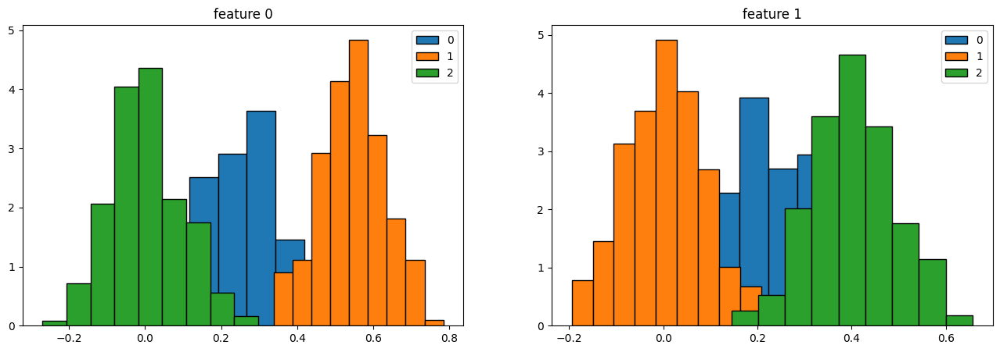

In [ ]:
# 2. Строим гистограммы распределения признаков в каждом классе
fig, ax = plt.subplots(1,n_dim, figsize=(16,5))
for i in range(n_dim):
  for label in class_labels:

    n_bins = math.ceil(math.log(n[label],2)+1)
    ax[i].hist(samples_by_class[label][:,i], bins=n_bins, density=True, edgecolor='black', label=label)

  ax[i].set_title(f'feature {i}')
  ax[i].legend()

Text(0, 0.5, 'feature 1')

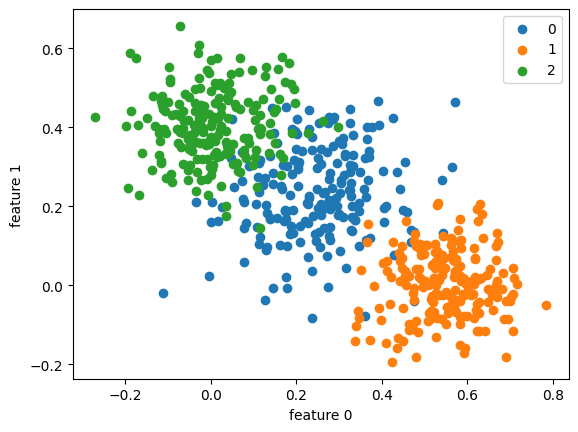

In [ ]:
# 2. Строим диаграммы рассеяния
fig, ax = plt.subplots()
for label in class_labels:
  ax.scatter(samples_by_class[label][:,0], samples_by_class[label][:,1], label=label)
ax.legend()
ax.set_xlabel('feature 0')
ax.set_ylabel('feature 1')

/tmp/ipykernel_273443/3947941808.py:4: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  ax[i].boxplot([samples_by_class[label][:,i] for label in class_labels], labels=class_labels)
/tmp/ipykernel_273443/3947941808.py:4: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  ax[i].boxplot([samples_by_class[label][:,i] for label in class_labels], labels=class_labels)


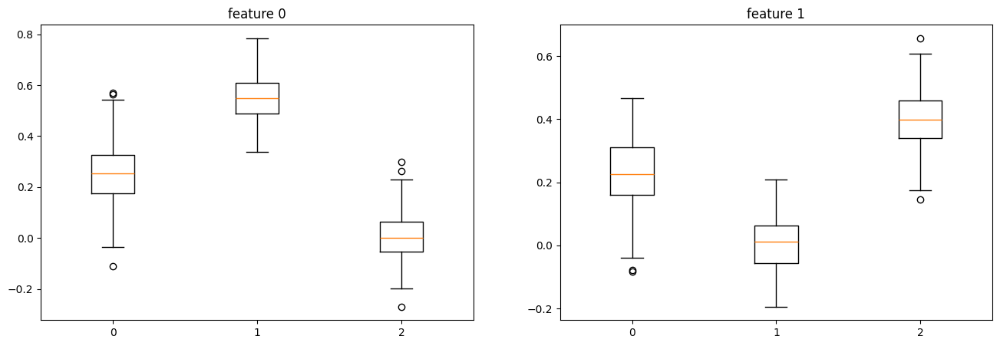

In [ ]:
# 2. Строим box-and-whisker
fig, ax = plt.subplots(1,n_dim, figsize=(16,5))
for i in range(n_dim):
  ax[i].boxplot([samples_by_class[label][:,i] for label in class_labels], labels=class_labels)
  ax[i].set_title(f'feature {i}')

In [ ]:
# 2. Оцениваем статистические характеристики выборки и соответсвие распределения данных нормальному распределению
for label,sample in samples_by_class.items():
  df = pd.DataFrame(sample, columns=['feature 0','feature 1'])
  print(f"class {label}\n")
  print(df.describe(),"\n")
  print(multivariate_normality(df, alpha=.05),"\n")


class 0

        feature 0   feature 1
count  200.000000  200.000000
mean     0.249695    0.231963
std      0.116856    0.115005
min     -0.110944   -0.082315
25%      0.174872    0.160360
50%      0.254795    0.224652
75%      0.325828    0.311744
max      0.570026    0.467583 

HZResults(hz=0.5151573127367026, pval=0.6995335926196057, normal=True) 

class 1

        feature 0   feature 1
count  200.000000  200.000000
mean     0.546874    0.003971
std      0.087219    0.083419
min      0.338172   -0.194318
25%      0.488666   -0.056495
50%      0.548506    0.011019
75%      0.609053    0.063580
max      0.784242    0.208135 

HZResults(hz=0.6882332459570151, pval=0.3545191026977995, normal=True) 

class 2

        feature 0   feature 1
count  200.000000  200.000000
mean     0.004894    0.403053
std      0.096091    0.089459
min     -0.269636    0.144509
25%     -0.052897    0.340795
50%     -0.000154    0.399108
75%      0.063873    0.460159
max      0.297584    0.656695 

HZResults(h

№3 Предобработка данных не требуется ,т.к. данные сгенерированы по заданному распределению

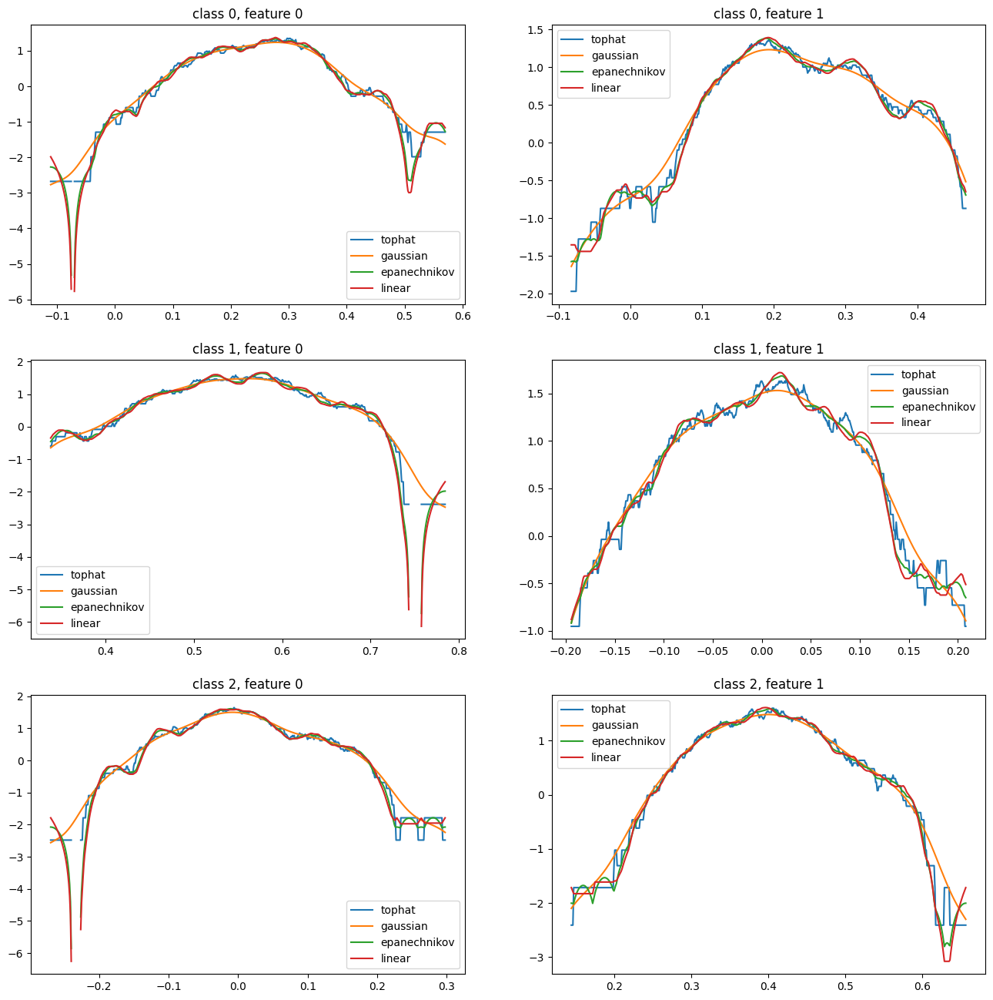

In [ ]:
# 4.1 Строим графики восстановленных одномерных плотностей
n_point = 500
silverman_windows_by_class_dim = defaultdict(dict)
fig, ax = plt.subplots(K,n_dim, figsize=(16,16))

for i in range(n_dim):
  for label in class_labels:

    std = np.std(samples_by_class[label][:,i])
    ptp = np.ptp(samples_by_class[label][:,i])
    silverman_windows_by_class_dim[label][i] = 0.9 * min(std, ptp/1.34) * n[label]**(-1/5)

    for kernel in ['tophat','gaussian', 'epanechnikov', 'linear']:

      kde_model = KernelDensity(kernel=kernel, bandwidth=silverman_windows_by_class_dim[label][i]).fit(samples_by_class[label][:,i:i+1])

      x_generated = np.reshape(np.linspace(np.min(samples_by_class[label][:,i]), np.max(samples_by_class[label][:,i]), n_point), (n_point,1))
      dens_predicted = kde_model.score_samples(x_generated)

      ax[label][i].plot(x_generated, dens_predicted,label = kernel)
      ax[label][i].set_title(f'class {label}, feature {i}')
      ax[label][i].legend()



In [9]:
# Рассчитываем ширину окон по правилу Сильвермана
silverman_windows_by_class = dict()

for label in class_labels:
  std = np.std(samples_by_class[label][:,:])
  ptp = np.ptp(samples_by_class[label][:,:])

  silverman_windows_by_class[label] = 0.9 * min(std, ptp/1.34) * n[label]**(-1/5)

print(silverman_windows_by_class)

{0: 0.03617710575721191, 1: 0.08873557834863853, 2: 0.06848488807830769}


In [10]:
# Разбиваем выборку на фолды
N_FOLDS = 50
skf = StratifiedKFold(n_splits=N_FOLDS, shuffle=True, random_state=42)
splits = [i for i in skf.split(X, labels)]

In [ ]:
# 4.2 Рассчитываем среднее значение и с.к.о (по фолдам) точности непараметрического байесовского классификатора
kernels = ['tophat', 'gaussian', 'epanechnikov', 'linear']

saved_kde_models_by_class = defaultdict(list)
saved_predicted_labels_train = defaultdict(list)
saved_predicted_labels_test = defaultdict(list)
saved_predicted_proba_train = defaultdict(list)
saved_predicted_proba_test = defaultdict(list)

accuracy_by_kernel_train = defaultdict(list)
accuracy_by_kernel_test = defaultdict(list)

for kernel in kernels:

  for train_index, test_index in splits:

      X_train, X_test = X[train_index], X[test_index]
      labels_train, labels_test = labels[train_index], labels[test_index]

      # обучаем KDE на текущем фолде и получаем вероятности классов
      models, predicted_labels_train, predicted_labels_test, proba_train, proba_test = evaluate_kde_split(
          X_train,
          X_test,
          labels_train,
          labels_test,
          kernel,
          silverman_windows_by_class
      )

      saved_kde_models_by_class[kernel].append(models)
      saved_predicted_labels_train[kernel].append(predicted_labels_train)
      saved_predicted_labels_test[kernel].append(predicted_labels_test)
      saved_predicted_proba_train[kernel].append(proba_train)
      saved_predicted_proba_test[kernel].append(proba_test)

      accuracy_by_kernel_train[kernel].append(metrics.accuracy_score(labels_train, predicted_labels_train))
      accuracy_by_kernel_test[kernel].append(metrics.accuracy_score(labels_test, predicted_labels_test))

mean_accuracy_train = {}
mean_accuracy_test = {}
std_accuracy_train = {}
std_accuracy_test = {}

for kernel in kernels:
  mean_accuracy_train[kernel] = np.mean(accuracy_by_kernel_train[kernel])
  mean_accuracy_test[kernel] = np.mean(accuracy_by_kernel_test[kernel])
  std_accuracy_train[kernel] = np.std(accuracy_by_kernel_train[kernel])
  std_accuracy_test[kernel] = np.std(accuracy_by_kernel_test[kernel])

  print(f"{kernel}:")
  print("mean accuracy train: ", mean_accuracy_train[kernel])
  print("mean accuracy test: ", mean_accuracy_test[kernel])
  print("std accuracy train: ", std_accuracy_train[kernel])
  print("std accuracy test: ", std_accuracy_test[kernel], "\n")

best_kernel = max(kernels, key=lambda k: mean_accuracy_test[k])
print(f"Лучший kernel по средней точности на тесте: {best_kernel}")

# Сохраняем результаты лучшей модели для дальнейших графиков и метрик
train_predictions_best = saved_predicted_labels_train[best_kernel]
test_predictions_best = saved_predicted_labels_test[best_kernel]
train_proba_best = saved_predicted_proba_train[best_kernel]
test_proba_best = saved_predicted_proba_test[best_kernel]


tophat:
mean accuracy train:  0.941360544217687
mean accuracy test:  0.9249999999999998
std accuracy train:  0.0019011140969363482
std accuracy test:  0.08036375634160796 

gaussian:
mean accuracy train:  0.9394897959183673
mean accuracy test:  0.9249999999999998
std accuracy train:  0.0015986394557823097
std accuracy test:  0.08036375634160796 

epanechnikov:
mean accuracy train:  0.9518027210884352
mean accuracy test:  0.9133333333333333
std accuracy train:  0.001386236998116639
std accuracy test:  0.07810249675906654 

linear:
mean accuracy train:  0.9571088435374151
mean accuracy test:  0.9166666666666667
std accuracy train:  0.001569424761232575
std accuracy test:  0.07264831572567788 

Лучший kernel по средней точности на тесте: tophat


In [ ]:
#4.3 Проводим сбор данных для построения графиков

bandwidth_grid = np.arange(1, 91, 5) / 1000

accuracy_means_by_kernel_train = defaultdict(list)
accuracy_means_by_kernel_test = defaultdict(list)

accuracy_stds_by_kernel_train = defaultdict(list)
accuracy_stds_by_kernel_test = defaultdict(list)

lambdas_by_class_kernel = {
  label: {kernel: [] for kernel in kernels} for label in class_labels
}

for par_w in bandwidth_grid:
  bandwidth_by_class = {label: par_w for label in class_labels}

  for kernel in kernels:

    for label in class_labels:
      lambdas_by_class_kernel[label][kernel].append(par_w / silverman_windows_by_class[label])

    fold_train_scores = []
    fold_test_scores = []

    for train_index, test_index in splits:

        X_train, X_test = X[train_index], X[test_index]
        labels_train, labels_test = labels[train_index], labels[test_index]

        _, predicted_labels_train, predicted_labels_test, _, _ = evaluate_kde_split(
            X_train,
            X_test,
            labels_train,
            labels_test,
            kernel,
            bandwidth_by_class
        )

        fold_train_scores.append(metrics.accuracy_score(labels_train, predicted_labels_train))
        fold_test_scores.append(metrics.accuracy_score(labels_test, predicted_labels_test))

    accuracy_means_by_kernel_train[kernel].append(np.mean(fold_train_scores))
    accuracy_means_by_kernel_test[kernel].append(np.mean(fold_test_scores))
    accuracy_stds_by_kernel_train[kernel].append(np.std(fold_train_scores))
    accuracy_stds_by_kernel_test[kernel].append(np.std(fold_test_scores))

print(lambdas_by_class_kernel)
print(accuracy_means_by_kernel_train)


{0: {'tophat': [0.027641791101562896, 0.16585074660937738, 0.3040597021171918, 0.44226865762500633, 0.5804776131328209, 0.7186865686406352, 0.8568955241484497, 0.9951044796562641, 1.1333134351640788, 1.271522390671893, 1.4097313461797076, 1.5479403016875222, 1.6861492571953365, 1.824358212703151, 1.9625671682109653, 2.10077612371878, 2.2389850792265946, 2.377194034734409], 'gaussian': [0.027641791101562896, 0.16585074660937738, 0.3040597021171918, 0.44226865762500633, 0.5804776131328209, 0.7186865686406352, 0.8568955241484497, 0.9951044796562641, 1.1333134351640788, 1.271522390671893, 1.4097313461797076, 1.5479403016875222, 1.6861492571953365, 1.824358212703151, 1.9625671682109653, 2.10077612371878, 2.2389850792265946, 2.377194034734409], 'epanechnikov': [0.027641791101562896, 0.16585074660937738, 0.3040597021171918, 0.44226865762500633, 0.5804776131328209, 0.7186865686406352, 0.8568955241484497, 0.9951044796562641, 1.1333134351640788, 1.271522390671893, 1.4097313461797076, 1.547940301

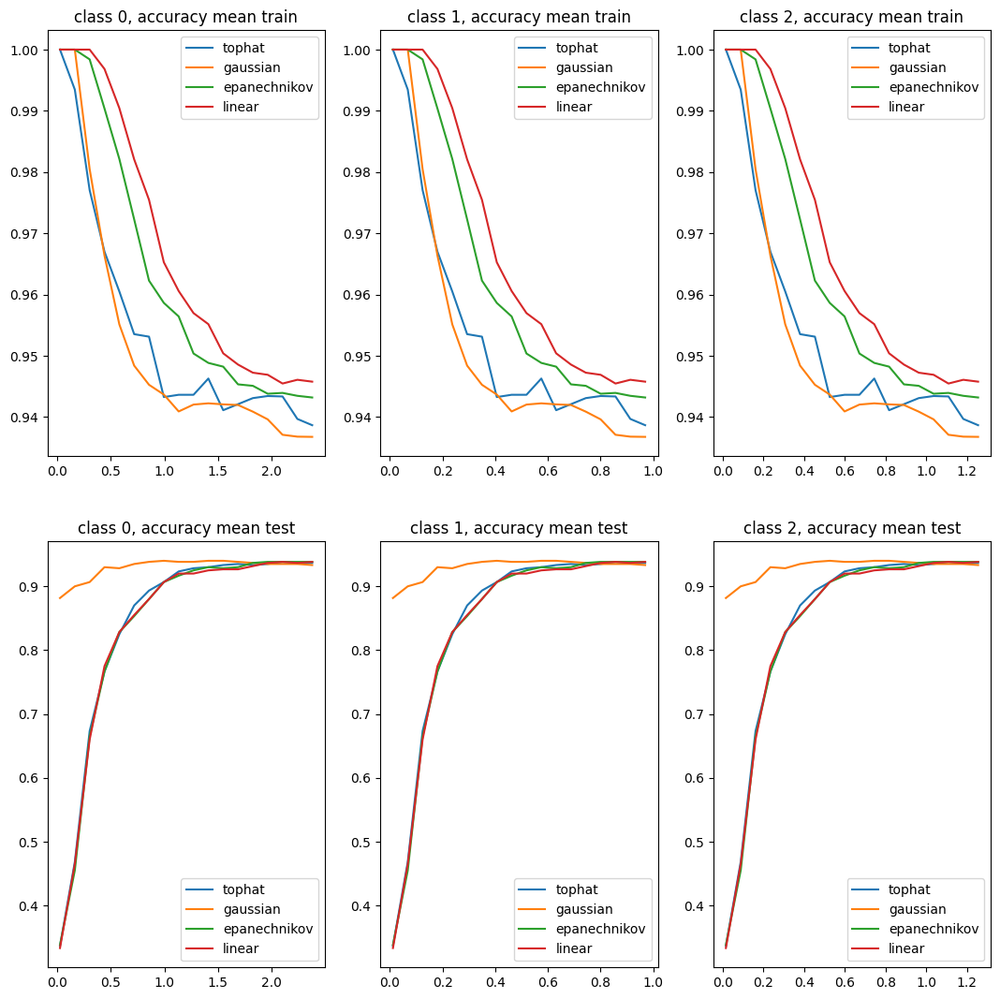

In [ ]:
# 4.3 Строим графики для accuracy
fig, ax = plt.subplots(2, K, figsize=(13,13))

for label in class_labels:

  for kernel in kernels:

    ax[0][label].plot(lambdas_by_class_kernel[label][kernel], accuracy_means_by_kernel_train[kernel], label = kernel)
    ax[1][label].plot(lambdas_by_class_kernel[label][kernel], accuracy_means_by_kernel_test[kernel], label = kernel)

  ax[0][label].set_title(f'class {label}, accuracy mean train')
  ax[0][label].legend()

  ax[1][label].set_title(f'class {label}, accuracy mean test')
  ax[1][label].legend()


In [14]:
for label in class_labels:

  for kernel in kernels:

    print(f"Class {label}, kernel {kernel}, lambdas with max accuracy (mean by folds) on train: {lambdas_by_class_kernel[label][kernel][accuracy_means_by_kernel_train[kernel].index(max(accuracy_means_by_kernel_train[kernel]))]}")
    print(f"Class {label}, kernel {kernel}, lambdas with max accuracy (mean by folds) on test: {lambdas_by_class_kernel[label][kernel][accuracy_means_by_kernel_test[kernel].index(max(accuracy_means_by_kernel_test[kernel]))]}\n")

Class 0, kernel tophat, lambdas with max accuracy (mean by folds) on train: 0.027641791101562896
Class 0, kernel tophat, lambdas with max accuracy (mean by folds) on test: 2.10077612371878

Class 0, kernel gaussian, lambdas with max accuracy (mean by folds) on train: 0.027641791101562896
Class 0, kernel gaussian, lambdas with max accuracy (mean by folds) on test: 0.9951044796562641

Class 0, kernel epanechnikov, lambdas with max accuracy (mean by folds) on train: 0.027641791101562896
Class 0, kernel epanechnikov, lambdas with max accuracy (mean by folds) on test: 1.9625671682109653

Class 0, kernel linear, lambdas with max accuracy (mean by folds) on train: 0.027641791101562896
Class 0, kernel linear, lambdas with max accuracy (mean by folds) on test: 2.10077612371878

Class 1, kernel tophat, lambdas with max accuracy (mean by folds) on train: 0.01126943688889974
Class 1, kernel tophat, lambdas with max accuracy (mean by folds) on test: 0.8564772035563801

Class 1, kernel gaussian, lam

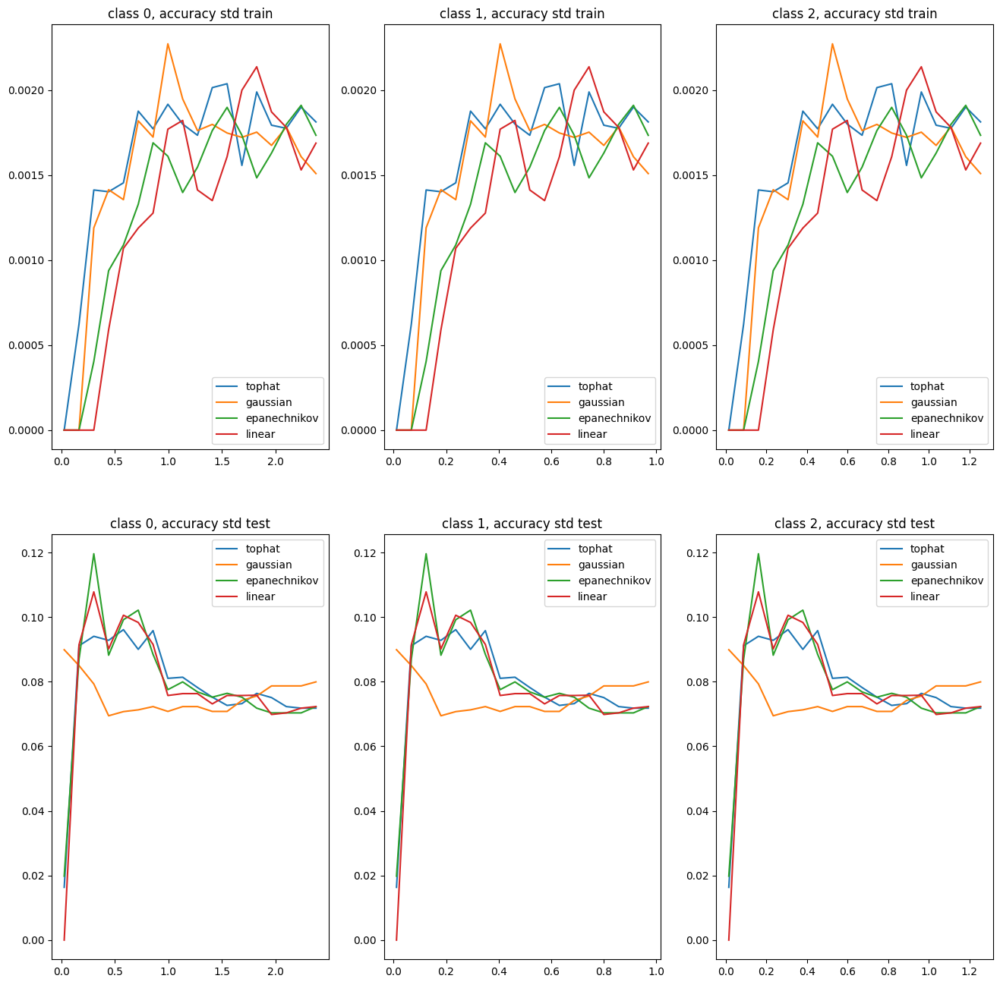

In [15]:
#4.3 Строим графики для с.к.о
fig, ax = plt.subplots(2, K, figsize=(16,16))

for label in class_labels:

  for kernel in kernels:

    ax[0][label].plot(lambdas_by_class_kernel[label][kernel], accuracy_stds_by_kernel_train[kernel], label = kernel)
    ax[1][label].plot(lambdas_by_class_kernel[label][kernel], accuracy_stds_by_kernel_test[kernel], label = kernel)

  ax[0][label].set_title(f'class {label}, accuracy std train')
  ax[0][label].legend()
  ax[1][label].set_title(f'class {label}, accuracy std test')
  ax[1][label].legend()

In [16]:
for label in class_labels:

  for kernel in kernels:

    print(f"Class {label}, kernel {kernel}, lambdas with min variance accuracy (std by folds) on train: {lambdas_by_class_kernel[label][kernel][accuracy_stds_by_kernel_train[kernel].index(min(accuracy_stds_by_kernel_train[kernel]))]}")
    print(f"Class {label}, kernel {kernel}, lambdas with min variance accuracy (std by folds) on test: {lambdas_by_class_kernel[label][kernel][accuracy_stds_by_kernel_test[kernel].index(min(accuracy_stds_by_kernel_test[kernel]))]}\n")

Class 0, kernel tophat, lambdas with min variance accuracy (std by folds) on train: 0.027641791101562896
Class 0, kernel tophat, lambdas with min variance accuracy (std by folds) on test: 0.027641791101562896

Class 0, kernel gaussian, lambdas with min variance accuracy (std by folds) on train: 0.027641791101562896
Class 0, kernel gaussian, lambdas with min variance accuracy (std by folds) on test: 0.44226865762500633

Class 0, kernel epanechnikov, lambdas with min variance accuracy (std by folds) on train: 0.027641791101562896
Class 0, kernel epanechnikov, lambdas with min variance accuracy (std by folds) on test: 0.027641791101562896

Class 0, kernel linear, lambdas with min variance accuracy (std by folds) on train: 0.027641791101562896
Class 0, kernel linear, lambdas with min variance accuracy (std by folds) on test: 0.027641791101562896

Class 1, kernel tophat, lambdas with min variance accuracy (std by folds) on train: 0.01126943688889974
Class 1, kernel tophat, lambdas with min 

In [17]:
# # 4.4 Строим диаграммы областей классов обученных классификаторов

# models_for_best_kernel = saved_kde_models_by_class[best_kernel]

# n_point = 100
# grid_axes = [np.linspace(np.min(X[:, i]), np.max(X[:, i]), n_point) for i in range(n_dim)]
# m = np.meshgrid(*grid_axes)
# x = np.column_stack([axis.ravel() for axis in m])

# fig, ax = plt.subplots(N_FOLDS, 1, figsize=(6, 6 * N_FOLDS))
# ax = np.atleast_1d(ax)

# for j, (splited_indexes, models) in enumerate(zip(splits, models_for_best_kernel)):

#   train_index, test_index = splited_indexes
#   X_train, X_test = X[train_index], X[test_index]

#   predicted_labels_mesh = predict_labels_by_kde(models, x)

#   ax[j].scatter(x[:, 0], x[:, 1], c=predicted_labels_mesh, s=5, cmap='viridis')
#   ax[j].scatter(X_train[:, 0], X_train[:, 1], c='white', marker='.', label='train', edgecolors='none')
#   ax[j].scatter(X_test[:, 0], X_test[:, 1], c='orange', marker='.', label='test', edgecolors='none')
#   ax[j].set_title(f'decision regions. fold: {j}')
#   ax[j].legend()




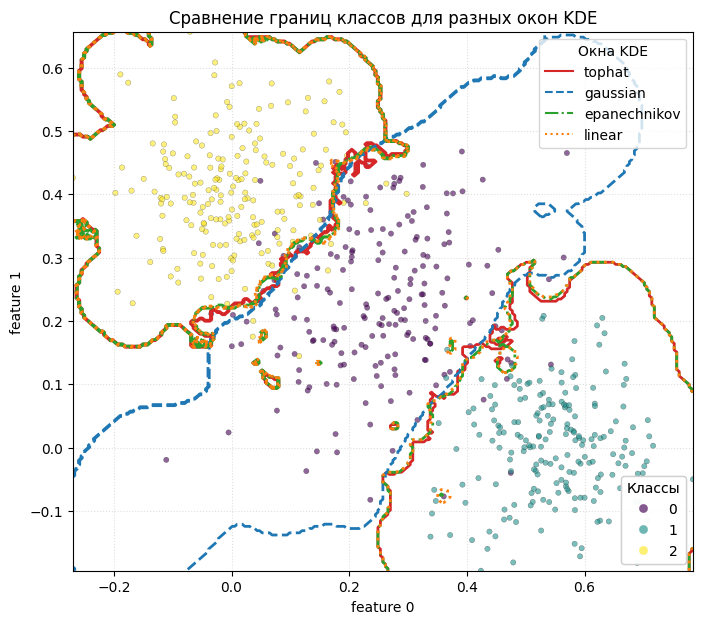

In [ ]:
# 4.4 Диаграмма с наложением границ классов для всех окон
from matplotlib.lines import Line2D

n_point = 250
# Строим регулярную сетку для оценки границ
x_axis = np.linspace(np.min(X[:, 0]), np.max(X[:, 0]), n_point)
y_axis = np.linspace(np.min(X[:, 1]), np.max(X[:, 1]), n_point)
xx, yy = np.meshgrid(x_axis, y_axis)
grid_points = np.column_stack([xx.ravel(), yy.ravel()])

# Настраиваем единый стиль для разных типов окон
kernel_styles = {
    'tophat': {'color': '#d62728', 'linestyle': '-'},
    'gaussian': {'color': '#1f77b4', 'linestyle': '--'},
    'epanechnikov': {'color': '#2ca02c', 'linestyle': '-.'},
    'linear': {'color': '#ff7f0e', 'linestyle': ':'}
}

fig, ax = plt.subplots(figsize=(8, 7))
legend_lines = []

for kernel, style in kernel_styles.items():
    # Используем модели с первого фолда как репрезентативные для визуализации
    models = saved_kde_models_by_class[kernel][0]
    proba_mesh = predict_proba_by_kde(models, grid_points)
    labels_mesh = np.argmax(proba_mesh, axis=1).reshape(n_point, n_point)

    # Подчеркиваем контурными линиями границы классов
    contours = ax.contour(
        xx,
        yy,
        labels_mesh,
        levels=[0.5, 1.5],
        colors=style['color'],
        linestyles=style['linestyle'],
        linewidths=2
    )
    legend_lines.append(Line2D([0], [0], color=style['color'], linestyle=style['linestyle'], label=kernel))

scatter = ax.scatter(X[:, 0], X[:, 1], c=labels, cmap='viridis', s=15, alpha=0.6, edgecolor='k', linewidth=0.2)
ax.set_title('Сравнение границ классов для разных окон KDE')
ax.set_xlabel('feature 0')
ax.set_ylabel('feature 1')

legend1 = ax.legend(handles=legend_lines, title='Окна KDE', loc='upper right')
ax.add_artist(legend1)
legend2 = ax.legend(*scatter.legend_elements(), title='Классы', loc='lower right')
ax.add_artist(legend2)
ax.grid(True, linestyle=':', alpha=0.4)
plt.show()


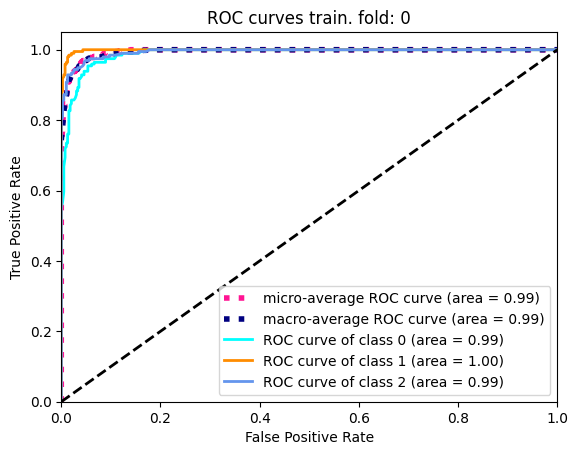

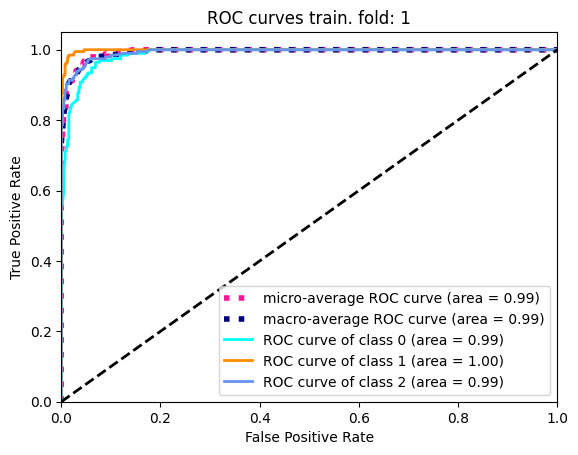

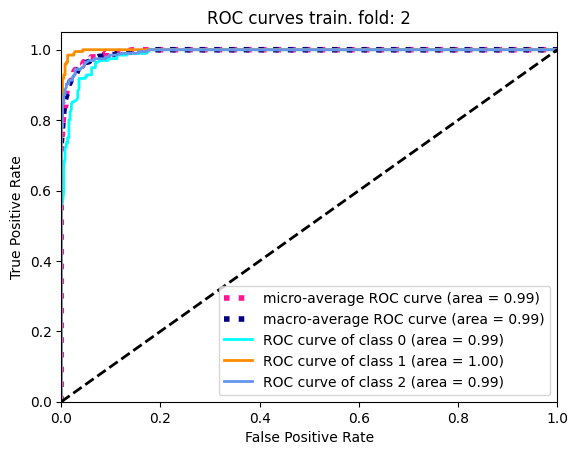

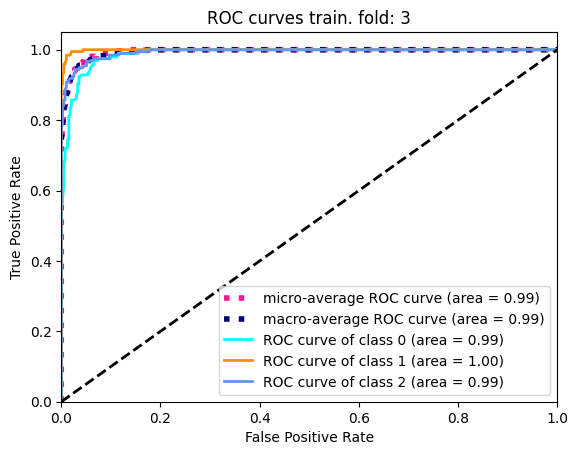

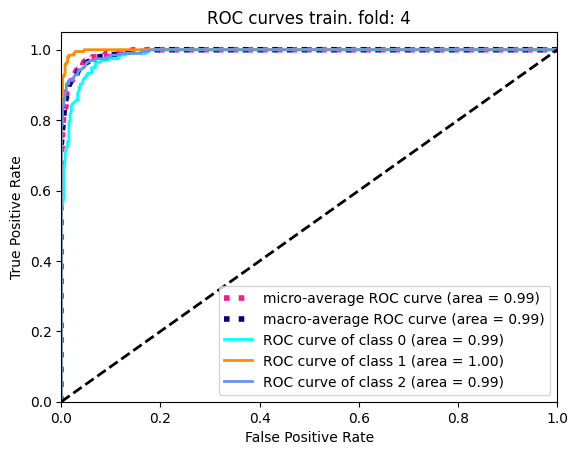

...

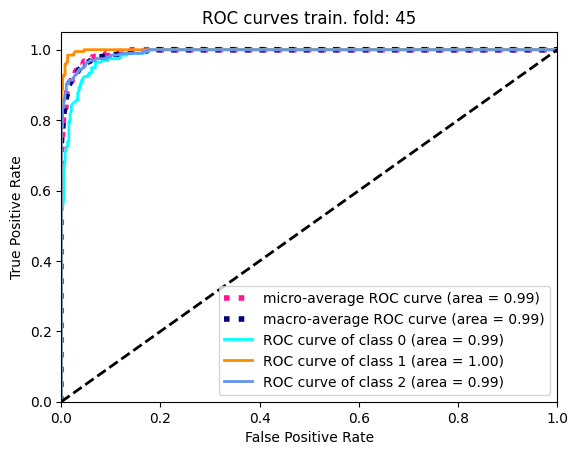

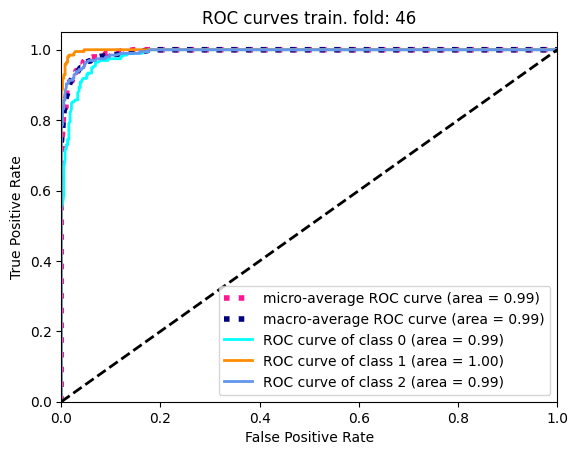

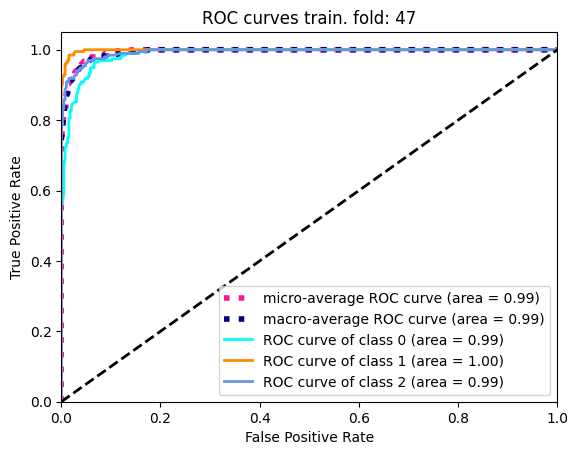

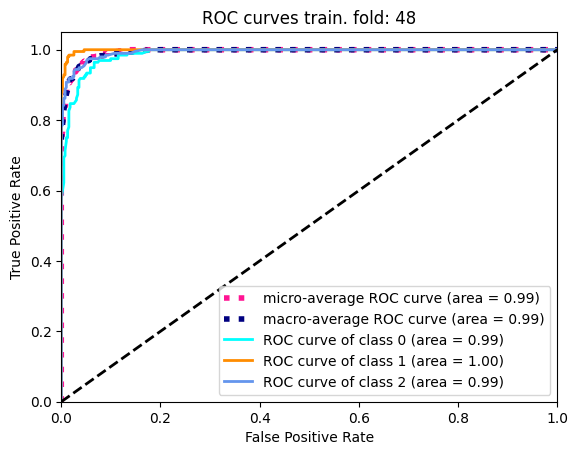

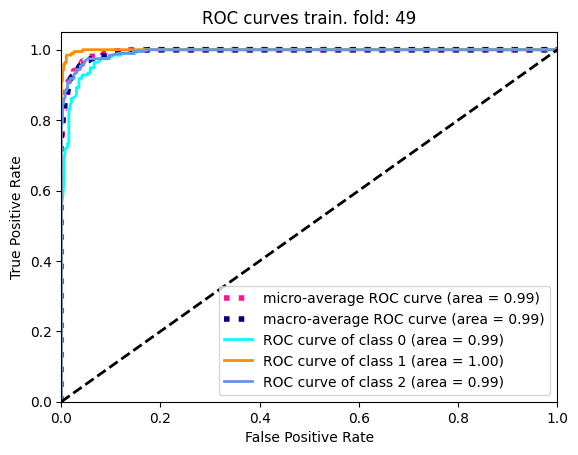

In [19]:
# 5. Строим micro-average и macro-average ROC-кривые и рассчитываем micro-average и macro-average ROC AUC для обучающих данных

for j, (splited_indexes, proba_train, proba_test) in enumerate(
    zip(splits, train_proba_best, test_proba_best)
):

  train_index, test_index = splited_indexes
  labels_train, labels_test = labels[train_index], labels[test_index]

  bin_labels_train = label_binarize(labels_train, classes=class_labels)

  fpr = dict()
  tpr = dict()
  roc_auc = dict()

  for i in range(K):
      fpr[i], tpr[i], _ = roc_curve(bin_labels_train[:, i], proba_train[:, i])
      roc_auc[i] = auc(fpr[i], tpr[i])

  fpr["micro"], tpr["micro"], _ = roc_curve(bin_labels_train.ravel(), proba_train.ravel())
  roc_auc["micro"] = auc(fpr["micro"], tpr["micro"])

  all_fpr = np.unique(np.concatenate([fpr[i] for i in range(K)]))
  mean_tpr = np.zeros_like(all_fpr)
  for i in range(K):
      mean_tpr += interp(all_fpr, fpr[i], tpr[i])

  mean_tpr /= K

  fpr["macro"] = all_fpr
  tpr["macro"] = mean_tpr
  roc_auc["macro"] = auc(fpr["macro"], tpr["macro"])

  plt.figure()
  plt.plot(fpr["micro"], tpr["micro"],
          label='micro-average ROC curve (area = {0:0.2f})'
                ''.format(roc_auc["micro"]),
          color='deeppink', linestyle=':', linewidth=4)

  plt.plot(fpr["macro"], tpr["macro"],
          label='macro-average ROC curve (area = {0:0.2f})'
                ''.format(roc_auc["macro"]),
          color='navy', linestyle=':', linewidth=4)

  colors = cycle(['aqua', 'darkorange', 'cornflowerblue'])
  for i, color in zip(range(K), colors):
      plt.plot(fpr[i], tpr[i], color=color, lw=2,
              label='ROC curve of class {0} (area = {1:0.2f})'
              ''.format(i, roc_auc[i]))

  plt.plot([0, 1], [0, 1], 'k--', lw=2)
  plt.xlim([0.0, 1.0])
  plt.ylim([0.0, 1.05])
  plt.xlabel('False Positive Rate')
  plt.ylabel('True Positive Rate')
  plt.title(f'ROC curves train. fold: {j}')
  plt.legend(loc="lower right")
  plt.show()


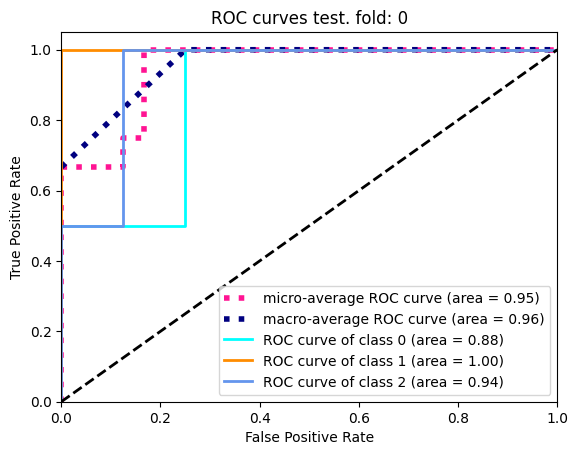

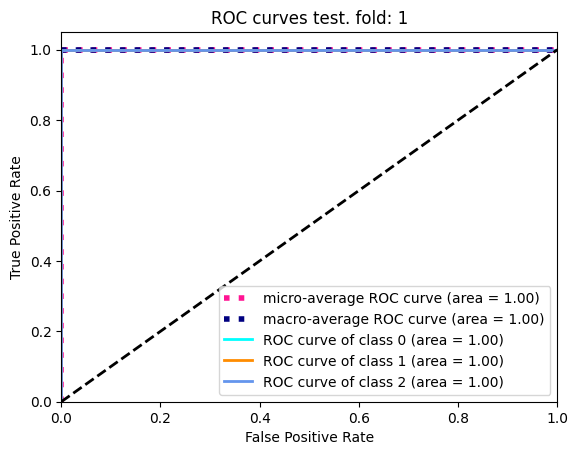

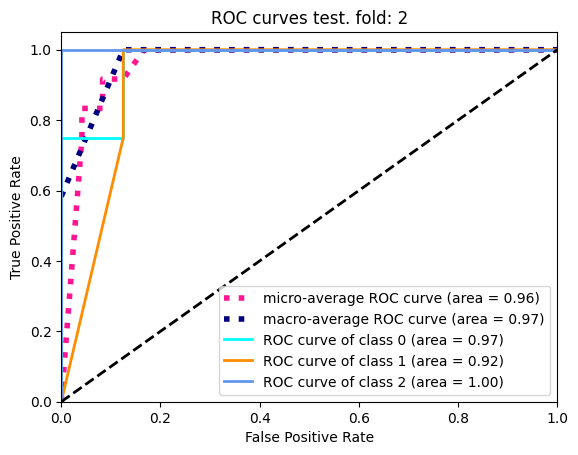

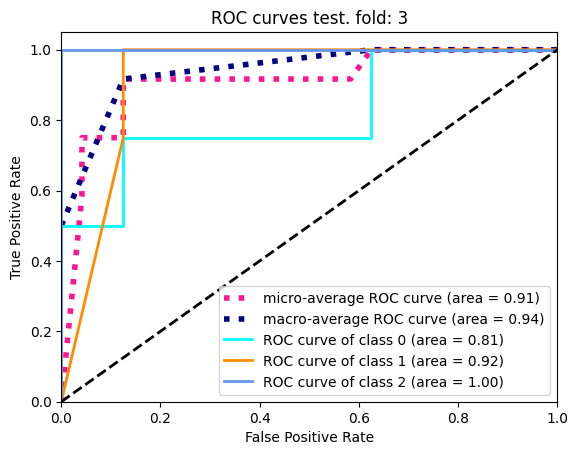

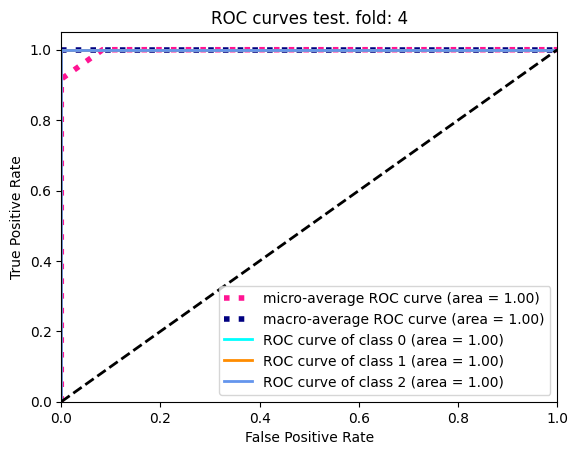

...

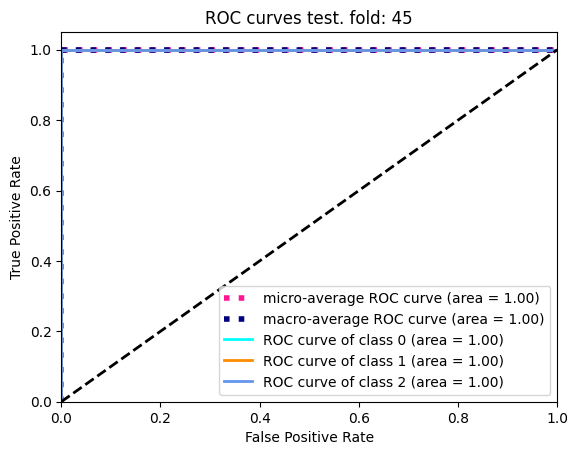

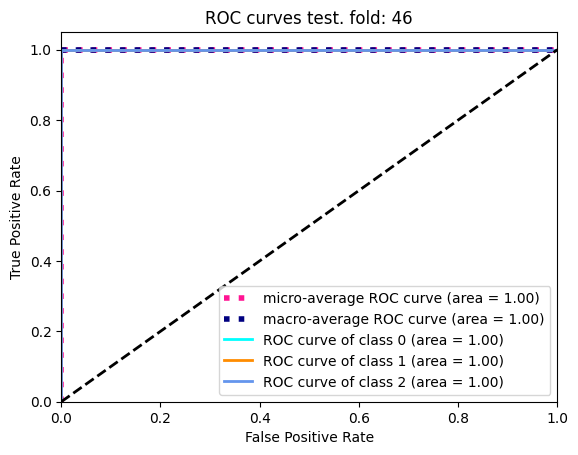

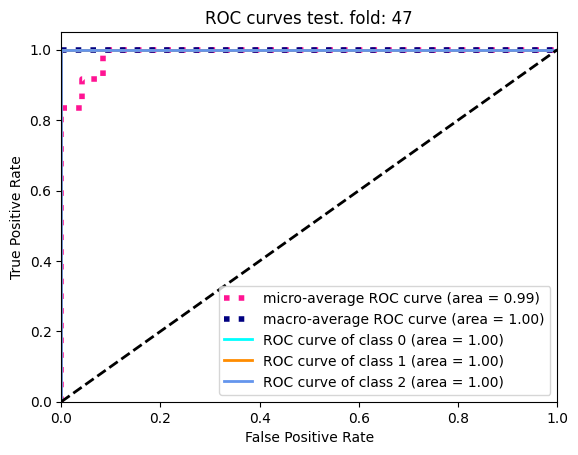

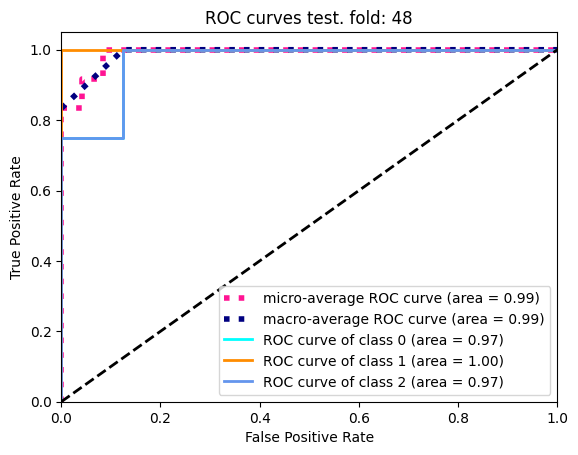

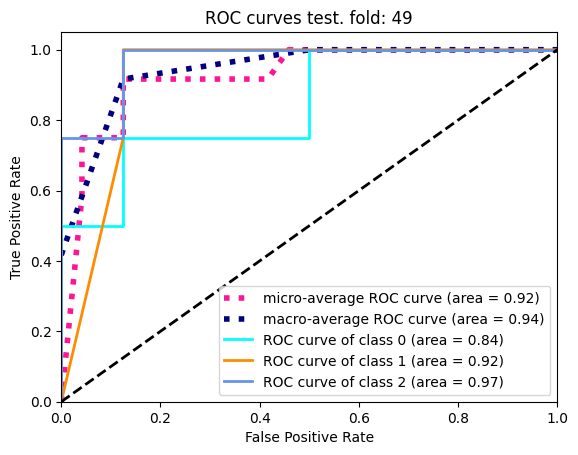

In [20]:
# 5. Строим micro-average и macro-average ROC-кривые и рассчитываем micro-average и macro-average ROC AUC для тестовых данных

for j, (splited_indexes, proba_train, proba_test) in enumerate(
    zip(splits, train_proba_best, test_proba_best)
):

  train_index, test_index = splited_indexes
  labels_train, labels_test = labels[train_index], labels[test_index]

  bin_labels_test = label_binarize(labels_test, classes=class_labels)

  fpr = dict()
  tpr = dict()
  roc_auc = dict()

  for i in range(K):
      fpr[i], tpr[i], _ = roc_curve(bin_labels_test[:, i], proba_test[:, i])
      roc_auc[i] = auc(fpr[i], tpr[i])

  fpr["micro"], tpr["micro"], _ = roc_curve(bin_labels_test.ravel(), proba_test.ravel())
  roc_auc["micro"] = auc(fpr["micro"], tpr["micro"])

  all_fpr = np.unique(np.concatenate([fpr[i] for i in range(K)]))
  mean_tpr = np.zeros_like(all_fpr)
  for i in range(K):
      mean_tpr += interp(all_fpr, fpr[i], tpr[i])

  mean_tpr /= K

  fpr["macro"] = all_fpr
  tpr["macro"] = mean_tpr
  roc_auc["macro"] = auc(fpr["macro"], tpr["macro"])

  plt.figure()
  plt.plot(fpr["micro"], tpr["micro"],
          label='micro-average ROC curve (area = {0:0.2f})'
                ''.format(roc_auc["micro"]),
          color='deeppink', linestyle=':', linewidth=4)

  plt.plot(fpr["macro"], tpr["macro"],
          label='macro-average ROC curve (area = {0:0.2f})'
                ''.format(roc_auc["macro"]),
          color='navy', linestyle=':', linewidth=4)

  colors = cycle(['aqua', 'darkorange', 'cornflowerblue'])
  for i, color in zip(range(K), colors):
      plt.plot(fpr[i], tpr[i], color=color, lw=2,
              label='ROC curve of class {0} (area = {1:0.2f})'
              ''.format(i, roc_auc[i]))

  plt.plot([0, 1], [0, 1], 'k--', lw=2)
  plt.xlim([0.0, 1.0])
  plt.ylim([0.0, 1.05])
  plt.xlabel('False Positive Rate')
  plt.ylabel('True Positive Rate')
  plt.title(f'ROC curves test. fold: {j}')
  plt.legend(loc="lower right")
  plt.show()


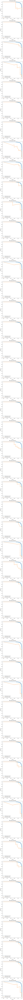

In [21]:
# 5. Строим PR-кривые и рассчитываем PR AUC
from sklearn.metrics import precision_recall_curve

fig, ax = plt.subplots(N_FOLDS, 1, figsize=(6, 6 * N_FOLDS))

for j, (splited_indexes, proba_train, proba_test) in enumerate(
    zip(splits, train_proba_best, test_proba_best)
):

  train_index, test_index = splited_indexes
  labels_train, labels_test = labels[train_index], labels[test_index]

  bin_labels_train = label_binarize(labels_train, classes=class_labels)
  precision_train, recall_train, thresholds_train = precision_recall_curve(bin_labels_train.ravel(), proba_train.ravel())
  pr_auc_train = auc(recall_train, precision_train)

  bin_labels_test = label_binarize(labels_test, classes=class_labels)
  precision_test, recall_test, thresholds_test = precision_recall_curve(bin_labels_test.ravel(), proba_test.ravel())
  pr_auc_test = auc(recall_test , precision_test )

  ax[j].plot(recall_train , precision_train , marker='.', label=f'PR AUC train: {round(pr_auc_train ,2)}')
  ax[j].plot(recall_test , precision_test , marker='.', label=f'PR AUC test: {round(pr_auc_test ,2)}')

  ax[j].set_xlabel('Recall')
  ax[j].set_ylabel('Precision')
  ax[j].set_title(f'PR curves. fold: {j}')
  ax[j].legend()

In [22]:
# 6 Рассчитываем среднее значение и с.к.о (по фолдам) точности параметрического байесовского классификатора
accuracy_train = []
accuracy_test = []

for train_index, test_index in splits:
  X_train, X_test = X[train_index], X[test_index]
  labels_train, labels_test = labels[train_index], labels[test_index]

  nb_model = GaussianNB()
  nb_model.fit(X_train, labels_train)

  predicted_labels_train = nb_model.predict(X_train)
  predicted_labels_test = nb_model.predict(X_test)

  accuracy_train.append(nb_model.score(X_train, labels_train))
  accuracy_test.append(nb_model.score(X_test, labels_test))


print("mean accuracy train: ", np.array(accuracy_train).mean())
print("mean accuracy test: ", np.array(accuracy_test).mean())
print("std accuracy train: ", np.array(accuracy_train).std())
print("std accuracy test: ", np.array(accuracy_test).std(),'\n')

mean accuracy train:  0.9415986394557823
mean accuracy test:  0.9399999999999998
std accuracy train:  0.0017872523340707112
std accuracy test:  0.07272474743090475 



In [ ]:
# 7. Исследование влияния априорных вероятностей
prior_configs = {
    'uniform': None,
    'сдвиг к классу 0 (0.6/0.3/0.1)': np.array([0.6, 0.3, 0.1]),
    'сдвиг к классу 2 (0.2/0.2/0.6)': np.array([0.2, 0.2, 0.6])
}

prior_results = []

for name, priors in prior_configs.items():
    train_scores = []
    test_scores = []

    for train_index, test_index in splits:
        X_train, X_test = X[train_index], X[test_index]
        labels_train, labels_test = labels[train_index], labels[test_index]

        # Переобучаем лучшую KDE-модель с заданными априорными вероятностями для оценки чувствительности
        _, pred_train, pred_test, _, _ = evaluate_kde_split(
            X_train,
            X_test,
            labels_train,
            labels_test,
            best_kernel,
            silverman_windows_by_class,
            class_priors=priors
        )

        # Сохраняем качество на обучении и валидации
        train_scores.append(metrics.accuracy_score(labels_train, pred_train))
        test_scores.append(metrics.accuracy_score(labels_test, pred_test))

    prior_results.append({
        'prior': name,
        'mean_accuracy_train': np.mean(train_scores),
        'std_accuracy_train': np.std(train_scores),
        'mean_accuracy_test': np.mean(test_scores),
        'std_accuracy_test': np.std(test_scores)
    })

pd.DataFrame(prior_results)


,prior,mean_accuracy_train,std_accuracy_train,mean_accuracy_test,std_accuracy_test
0,uniform,0.941361,0.001901,0.925,0.080364
1,сдвиг к классу 0 (0.6/0.3/0.1),0.918980,0.002090,0.900,0.079931
2,сдвиг к классу 2 (0.2/0.2/0.6),0.928265,0.002222,0.895,0.074181


/tmp/ipykernel_273443/2110546172.py:29: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


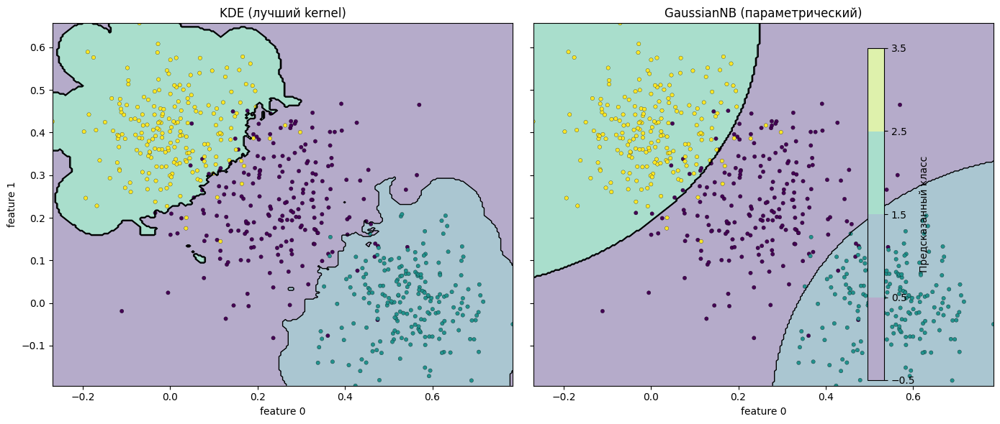

In [ ]:
# 7. Сравнение границ параметрического и непараметрического классификаторов
n_point_compare = 250
# Подготавливаем сетку для сравнения поверхностей решений
x_axis_cmp = np.linspace(np.min(X[:, 0]), np.max(X[:, 0]), n_point_compare)
y_axis_cmp = np.linspace(np.min(X[:, 1]), np.max(X[:, 1]), n_point_compare)
xx_cmp, yy_cmp = np.meshgrid(x_axis_cmp, y_axis_cmp)
grid_cmp = np.column_stack([xx_cmp.ravel(), yy_cmp.ravel()])

# Получаем прогнозы непараметрического классификатора на всей сетке
best_models = saved_kde_models_by_class[best_kernel][0]
kde_labels_mesh = predict_labels_by_kde(best_models, grid_cmp).reshape(n_point_compare, n_point_compare)

# Тренируем GaussianNB на всей выборке и получаем прогнозы для сравнения границ
gnb_full = GaussianNB().fit(X, labels)
gnb_labels_mesh = gnb_full.predict(grid_cmp).reshape(n_point_compare, n_point_compare)

fig, axes = plt.subplots(1, 2, figsize=(14, 6), sharex=True, sharey=True)
plots_info = [
    ('KDE (лучший kernel)', kde_labels_mesh),
    ('GaussianNB (параметрический)', gnb_labels_mesh)
]

for ax, (title, mesh) in zip(axes, plots_info):
    contour = ax.contourf(xx_cmp, yy_cmp, mesh, alpha=0.4, levels=np.arange(-0.5, K + 1.5, 1), cmap='viridis')
    ax.contour(xx_cmp, yy_cmp, mesh, levels=[0.5, 1.5], colors='k', linewidths=1)
    ax.scatter(X[:, 0], X[:, 1], c=labels, cmap='viridis', s=15, edgecolor='k', linewidth=0.2)
    ax.set_title(title)
    ax.set_xlabel('feature 0')

axes[0].set_ylabel('feature 1')
fig.colorbar(contour, ax=axes, fraction=0.046, pad=0.04, label='Предсказанный класс')
plt.tight_layout()
plt.show()


In [42]:
# 8. Выводы о ширине и типе окна
from IPython.display import Markdown

lines = []
lines.append(f"Лучшее ядро по средней точности на тестовой выборке: **{best_kernel}**.\n")

for kernel in kernels:
    idx_best = int(np.argmax(accuracy_means_by_kernel_test[kernel]))
    lambda_axis = lambdas_by_class_kernel[class_labels[0]][kernel]
    lambda_best = lambda_axis[idx_best]
    acc_mean = accuracy_means_by_kernel_test[kernel][idx_best]
    acc_std = accuracy_stds_by_kernel_test[kernel][idx_best]
    lines.append(
        f"\n*{kernel}:* максимум точности на тесте достигается при λ≈{lambda_best:.2f} (accuracy≈{acc_mean:.3f}, std≈{acc_std:.3f})."
    )

Markdown("\n".join(lines))


Лучшее ядро по средней точности на тестовой выборке: **tophat**.


*tophat:* максимум точности на тесте достигается при λ≈2.10 (accuracy≈0.938, std≈0.072).

*gaussian:* максимум точности на тесте достигается при λ≈1.00 (accuracy≈0.940, std≈0.071).

*epanechnikov:* максимум точности на тесте достигается при λ≈1.96 (accuracy≈0.938, std≈0.070).

*linear:* максимум точности на тесте достигается при λ≈2.10 (accuracy≈0.938, std≈0.070).

In [43]:
# 9. Рассчитываем среднее значение и с.к.о (по фолдам) точности логистической регрессии

accuracy_train = []
accuracy_test = []

for train_index, test_index in splits:

  X_train, X_test = X[train_index], X[test_index]
  labels_train, labels_test = labels[train_index], labels[test_index]

  lr_model = LogisticRegression(solver='lbfgs', multi_class='multinomial', max_iter=1000).fit(X_train,labels_train)

  predicted_labels_train = lr_model.predict(X_train)
  predicted_labels_test = lr_model.predict(X_test)

  accuracy_train.append(metrics.accuracy_score(labels_train, predicted_labels_train))
  accuracy_test.append(metrics.accuracy_score(labels_test, predicted_labels_test))

print("mean accuracy train: ", np.array(accuracy_train).mean())
print("mean accuracy test: ", np.array(accuracy_test).mean())
print("std accuracy train: ", np.array(accuracy_train).std())
print("std accuracy test: ", np.array(accuracy_test).std(),'\n')



mean accuracy train:  0.9279931972789117
mean accuracy test:  0.9266666666666667
std accuracy train:  0.0019719092572293593
std accuracy test:  0.07753135566408671 



In [ ]:
#  Сравнение границ параметрического, непараметрического классификаторов и логистической регрессии
n_point_compare = 250
# Подготавливаем сетку для сравнения поверхностей решений
x_axis_cmp = np.linspace(np.min(X[:, 0]), np.max(X[:, 0]), n_point_compare)
y_axis_cmp = np.linspace(np.min(X[:, 1]), np.max(X[:, 1]), n_point_compare)
xx_cmp, yy_cmp = np.meshgrid(x_axis_cmp, y_axis_cmp)
grid_cmp = np.column_stack([xx_cmp.ravel(), yy_cmp.ravel()])

# Получаем прогнозы непараметрического классификатора на всей сетке
best_models = saved_kde_models_by_class[best_kernel][0]
kde_labels_mesh = predict_labels_by_kde(best_models, grid_cmp).reshape(n_point_compare, n_point_compare)

# Тренируем GaussianNB на всей выборке и получаем прогнозы для сравнения границ
gnb_full = GaussianNB().fit(X, labels)
gnb_labels_mesh = gnb_full.predict(grid_cmp).reshape(n_point_compare, n_point_compare)

# Тренируем логистическую регрессию и получаем прогнозы на сетке
lr_full = LogisticRegression(solver='lbfgs', multi_class='multinomial', max_iter=1000).fit(X, labels)
lr_labels_mesh = lr_full.predict(grid_cmp).reshape(n_point_compare, n_point_compare)

fig, axes = plt.subplots(1, 3, figsize=(20, 6), sharex=True, sharey=True)
plots_info = [
    ('KDE (лучший kernel)', kde_labels_mesh),
    ('GaussianNB (параметрический)', gnb_labels_mesh),
    ('Logistic Regression', lr_labels_mesh)
]

for ax, (title, mesh) in zip(axes, plots_info):
    contour = ax.contourf(xx_cmp, yy_cmp, mesh, alpha=0.4, levels=np.arange(-0.5, K + 1.5, 1), cmap='viridis')
    ax.contour(xx_cmp, yy_cmp, mesh, levels=[0.5, 1.5], colors='k', linewidths=1)
    ax.scatter(X[:, 0], X[:, 1], c=labels, cmap='viridis', s=15, edgecolor='k', linewidth=0.2)
    ax.set_title(title)
    ax.set_xlabel('feature 0')

axes[0].set_ylabel('feature 1')
fig.colorbar(contour, ax=axes, fraction=0.046, pad=0.04, label='Предсказанный класс')
plt.tight_layout()
plt.show()

In [ ]:
#  Сводная таблица метрик для трёх классификаторов

def evaluate_model_cv(model_factory):
    train_scores = []
    test_scores = []
    for train_index, test_index in splits:
        model = model_factory()
        X_train, X_test = X[train_index], X[test_index]
        labels_train, labels_test = labels[train_index], labels[test_index]
        model.fit(X_train, labels_train)
        train_scores.append(metrics.accuracy_score(labels_train, model.predict(X_train)))
        test_scores.append(metrics.accuracy_score(labels_test, model.predict(X_test)))
    return {
        'mean_accuracy_train': np.mean(train_scores),
        'mean_accuracy_test': np.mean(test_scores),
        'std_accuracy_train': np.std(train_scores),
        'std_accuracy_test': np.std(test_scores)
    }

results = []
results.append({
    'model': f"KDE ({best_kernel})",
    'mean_accuracy_train': mean_accuracy_train[best_kernel],
    'mean_accuracy_test': mean_accuracy_test[best_kernel],
    'std_accuracy_train': std_accuracy_train[best_kernel],
    'std_accuracy_test': std_accuracy_test[best_kernel]
})

results.append({'model': 'GaussianNB', **evaluate_model_cv(lambda: GaussianNB())})
results.append({'model': 'Logistic Regression', **evaluate_model_cv(lambda: LogisticRegression(solver='lbfgs', multi_class='multinomial', max_iter=1000))})

pd.DataFrame(results)

